## Data Preperation

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd
import numpy as np
import folium
import urllib        #for url stuffimport io
import base64
#import gmaps       #for using google maps to visulalize places on maps
import re            #for processing regular expressions
import datetime      #for datetime operations
import calendar      #for calendar for datetime operations
import time          #to get the system time
import scipy         #for other dependancies
from sklearn.cluster import KMeans # for doing K-means clustering
#from haversine import haversine # for calculating haversine distance
import math          #for basic maths operations
import seaborn as sns #for making plots
import matplotlib.pyplot as plt # for plotting
import os  # for os commands
from scipy.misc import imread, imresize, imsave  # for plots 
#import plotly.plotly as py
#import plotly.graph_objs as go
#import plotly 
from IPython.display import HTML
from matplotlib.pyplot import *
from matplotlib import cm
from matplotlib import animation
import io
import base64
#plotly.offline.init_notebook_mode() # run at the start of every ipython notebook
%matplotlib inline


'''
    id - a unique identifier for each trip
    vendor_id - a code indicating the provider associated with the trip record
    pickup_datetime - date and time when the meter was engaged
    dropoff_datetime - date and time when the meter was disengaged
    passenger_count - the number of passengers in the vehicle (driver entered value)
    pickup_longitude - the longitude where the meter was engaged
    pickup_latitude - the latitude where the meter was engaged
    dropoff_longitude - the longitude where the meter was disengaged
    dropoff_latitude - the latitude where the meter was disengaged
    store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
    trip_duration - duration of the trip in seconds
'''

train_set = pd.read_csv("drive/My Drive/train.csv") #Reading the dataset in a dataframe using Pandas
test_set = pd.read_csv("drive/My Drive/test.csv") #Reading the dataset in a dataframe using Pandas
#train_set = train_set.sample(100)
#test_set = test_set.sample(100)

## Data Exploration

In [0]:
train_set.head(10)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435
5,id0801584,2,2016-01-30 22:01:40,2016-01-30 22:09:03,6,-73.982857,40.742195,-73.992081,40.749184,N,443
6,id1813257,1,2016-06-17 22:34:59,2016-06-17 22:40:40,4,-73.969017,40.757839,-73.957405,40.765896,N,341
7,id1324603,2,2016-05-21 07:54:58,2016-05-21 08:20:49,1,-73.969276,40.797779,-73.922470,40.760559,N,1551
8,id1301050,1,2016-05-27 23:12:23,2016-05-27 23:16:38,1,-73.999481,40.738400,-73.985786,40.732815,N,255
9,id0012891,2,2016-03-10 21:45:01,2016-03-10 22:05:26,1,-73.981049,40.744339,-73.973000,40.789989,N,1225


In [0]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
id                    1458644 non-null object
vendor_id             1458644 non-null int64
pickup_datetime       1458644 non-null object
dropoff_datetime      1458644 non-null object
passenger_count       1458644 non-null int64
pickup_longitude      1458644 non-null float64
pickup_latitude       1458644 non-null float64
dropoff_longitude     1458644 non-null float64
dropoff_latitude      1458644 non-null float64
store_and_fwd_flag    1458644 non-null object
trip_duration         1458644 non-null int64
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


In [0]:
train_set['store_and_fwd_flag'].value_counts()

N    1450599
Y       8045
Name: store_and_fwd_flag, dtype: int64

In [0]:
train_set.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


## Data Preprocessing

In [0]:
def changeinFields(data):
    #make the value of store_and_fwd_flage equals 1 or 0
    data['store_and_fwd_flag'] = 1 * (data.store_and_fwd_flag.values == 'Y')

    # Change the type of the following variables!
    data['pickup_datetime'] = pd.to_datetime(data.pickup_datetime)
    if 'dropoff_datetime' in data:
        data['dropoff_datetime'] = pd.to_datetime(data.dropoff_datetime)
    #*************make the duration time in minutes instead of seconds!
    if 'trip_duration' in data:
        data['duration_min'] = data['trip_duration'] / 60.0

    #**********convert latitude and logitude to kilo meters************
    allLat = np.array(list(data['pickup_latitude']) + list(data['dropoff_latitude']))
    allLong = np.array(list(data['pickup_longitude']) + list(data['dropoff_longitude']))
    medianLat = np.percentile(allLat, 50)
    medianLong = np.percentile(allLong, 50)

    latMultiplier = 111.32
    longMultiplier = np.cos(medianLat * (np.pi / 180.0)) * 111.32

    data['src_lat_km'] = latMultiplier * (data['pickup_latitude'] - medianLat)
    data['src_long_km'] = longMultiplier * (data['pickup_longitude'] - medianLong)
    data['dst_lat_km'] = latMultiplier * (data['dropoff_latitude'] - medianLat)
    data['dst_long_km'] = longMultiplier * (data['dropoff_longitude'] - medianLong)


In [0]:
changeinFields(train_set)

In [0]:
def checkData(Trainset,Testset):
    # check that all the ids are unique!
    print('Id is unique.') if Trainset.id.nunique() == Trainset.shape[0]else print('problem in ids!')
    print("Number of Nulls - {}.".format(train_set.isnull().sum().sum()))
    # check the store and forward has only two values
    print('The store_and_fwd_flag values {}.'.format(str(set(Trainset.store_and_fwd_flag.unique()
                                    ) | set(Trainset.store_and_fwd_flag.unique()))))

    #  check for the correctness ot the trip duration with the
    #       pickup_datetime and dropoff_datetime
    Trainset['check_trip_duration'] = (Trainset['dropoff_datetime'] -
     Trainset['pickup_datetime']).map(lambda x: x.total_seconds())

    duration_difference = Trainset[np.abs(Trainset['check_trip_duration'].
                       values - Trainset['trip_duration'].values) > 1]
    
    print('Trip_duration and datetimes are ok.') if len(duration_difference
    [['pickup_datetime', 'dropoff_datetime', 'trip_duration',
     'check_trip_duration']]) == 0 else print('Trip_duration and datetimes mismatch !')


In [0]:
checkData(train_set,test_set)
train_set = train_set.drop(['check_trip_duration'],axis=1)

Id is unique.
Number of Nulls - 0.
The store_and_fwd_flag values {0, 1}.
Trip_duration and datetimes are ok.


In [0]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 16 columns):
id                    1458644 non-null object
vendor_id             1458644 non-null int64
pickup_datetime       1458644 non-null datetime64[ns]
dropoff_datetime      1458644 non-null datetime64[ns]
passenger_count       1458644 non-null int64
pickup_longitude      1458644 non-null float64
pickup_latitude       1458644 non-null float64
dropoff_longitude     1458644 non-null float64
dropoff_latitude      1458644 non-null float64
store_and_fwd_flag    1458644 non-null int64
trip_duration         1458644 non-null int64
duration_min          1458644 non-null float64
src_lat_km            1458644 non-null float64
src_long_km           1458644 non-null float64
dst_lat_km            1458644 non-null float64
dst_long_km           1458644 non-null float64
dtypes: datetime64[ns](2), float64(9), int64(4), object(1)
memory usage: 178.1+ MB


In [0]:
def createUsefulFields(data):

    data['euclidian_distance'] = np.sqrt((data['src_lat_km'] -data['dst_lat_km']) ** 2 +
                        (data['src_long_km'] -data['dst_long_km']) ** 2)
    
    data['src_hourOfDay'] = (data['pickup_datetime'].dt.hour * 60.0 + data['pickup_datetime']
                               .dt.minute) / 60.0
    if 'trip_duration' in data:
        data['dst_hourOfDay'] = data['src_hourOfDay'] + data['duration_min'] / 60.0

    data['dayOfWeek'] = data['pickup_datetime'].dt.weekday
    data['hourOfWeek'] = data['dayOfWeek'] * 24.0 + data['src_hourOfDay']
    data['monthOfYear'] = data['pickup_datetime'].dt.month
    data['dayOfYear'] = data['pickup_datetime'].dt.dayofyear
    data['weekOfYear'] = data['pickup_datetime'].dt.weekofyear
    data['pick_day'] = data['pickup_datetime'].dt.dayofweek
    data['pick_hour'] = data['pickup_datetime'].dt.hour
    data['pick_date'] = data['pickup_datetime'].dt.date


In [0]:
createUsefulFields(train_set)

## Visualizations

In [0]:
#check for outliers first
def plt_boxplots(data):
    # show box plots
    for col in data.columns:
        sns.boxplot(x=data[col])
        plt.title(col)
        plt.show()


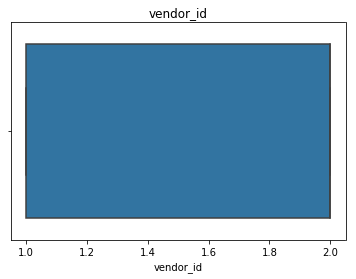

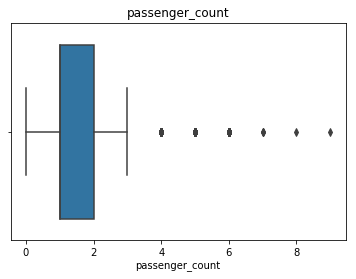

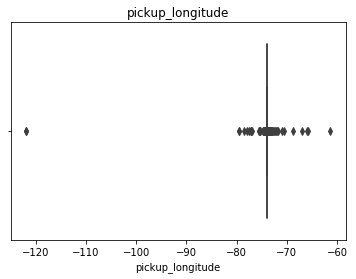

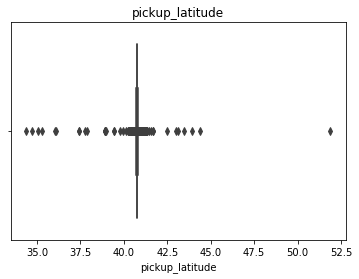

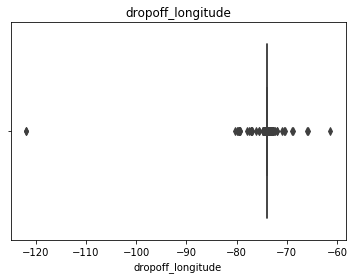

...

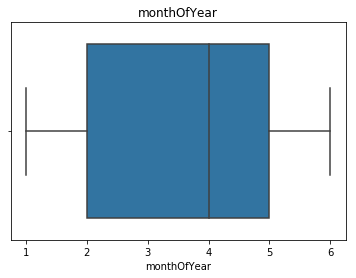

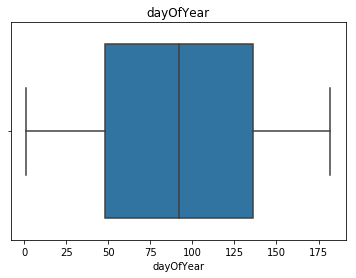

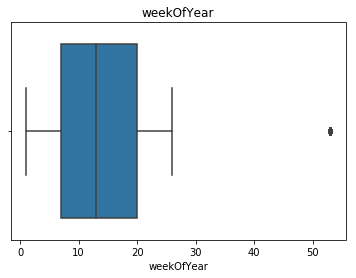

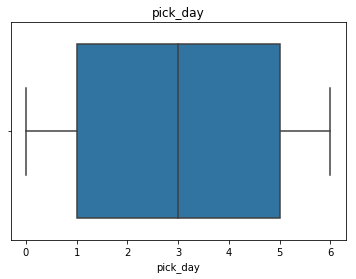

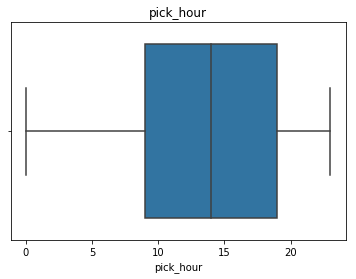

In [0]:
data_num = train_set.select_dtypes(include=['float64','int64'])
plt_boxplots(data_num)
#there is no benefit from that plot

In [0]:
def durationVSdist(train):
    plt.subplots(1,1,figsize=(15, 10), sharex=False, sharey = False)
    plt.subplot(1,2,1)
    plt.scatter(train['euclidian_distance'], train['duration_min'], c='r');
    plt.xlabel('Euclidian Distance between src and des. in km');
    plt.ylabel('Duration in min')
    plt.title('trip Duration vs euclidean trip Distance')

    train['log_duration'] = np.log(train['duration_min'].values + 1)
    plt.subplot(1,2,2)
    plt.scatter(train['euclidian_distance'], train['log_duration'], c='r');
    plt.xlabel('Euclidian Distance in km');
    plt.ylabel('log(1+Duration) in log(min)')
    plt.title('log of trip Duration vs euclidean trip Distance')
    plt.show()

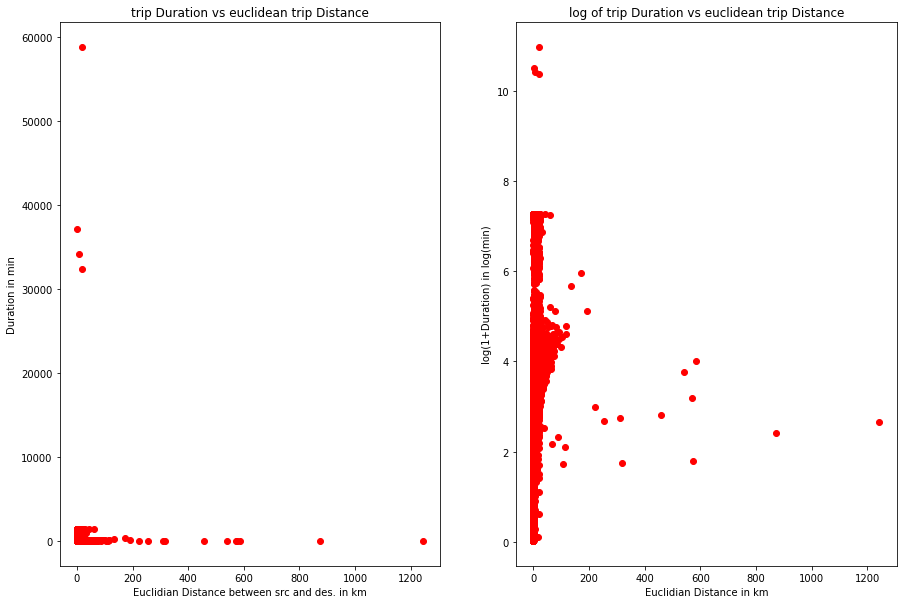

In [0]:
durationVSdist(train_set)

In [0]:
#There are many outliers that making the graph unclear
#So we should remove them

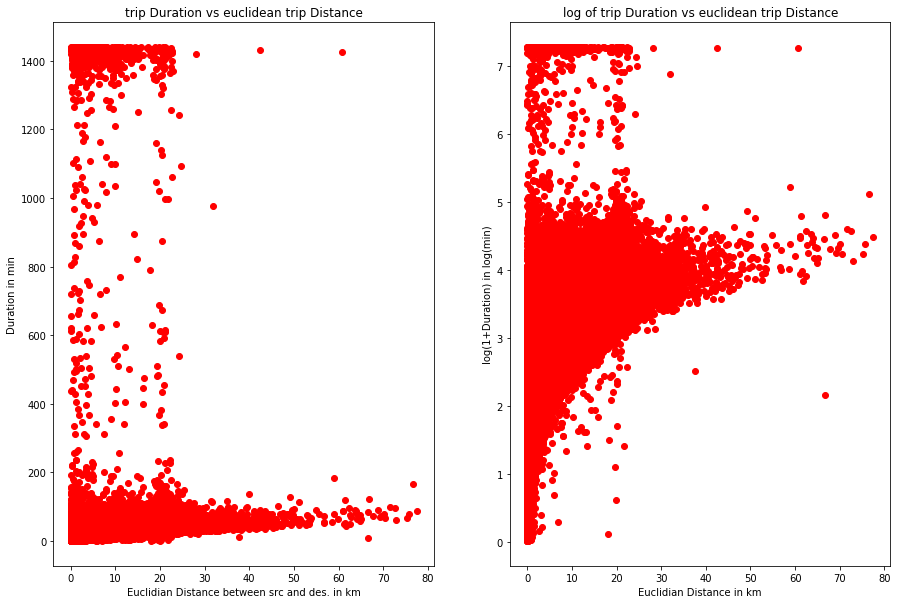

In [0]:
#There are many outliers that making the graph unclear
#So we should remove them
train_set = train_set[train_set.euclidian_distance> 0.01]
train_set = train_set.loc[(train_set.euclidian_distance < 80) & (train_set.duration_min < 20000)]
durationVSdist(train_set)

In [0]:
def distplot_vis(data):
    #style : Axes style parameters one of {darkgrid, whitegrid, dark, white, ticks}
    #palette : color pallettes one of {deep, muted, bright, pastel, dark, colorblind}
    sns.set(style="darkgrid", palette="deep")
    #subplots(nrows=1, ncols=1, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
    '''
    sharex, sharey : bool or {'none', 'all', 'row', 'col'}, default: False

        Controls sharing of properties among x (sharex) or y (sharey) axes:

                True or 'all': x- or y-axis will be shared among all subplots.
                False or 'none': each subplot x- or y-axis will be independent.
                'row': each subplot row will share an x- or y-axis.
                'col': each subplot column will share an x- or y-axis.


    '''
    f, axes = plt.subplots(1, 1, figsize=(11, 7), sharex=True)
    #Remove spines from plot.
    sns.despine(left=True)

    #Flexibly plot a univariate distribution of observations.
    #This function plot histogram and disrtubution
    sns.distplot(np.log(train_set['trip_duration'].values+1), axlabel = 'Log(trip_duration)', label = 'log(trip_duration)', bins = 60, color="r")
    #Set a property on an artist object.
    #is used to make y axis empty
    plt.setp(axes, yticks = [])
    #tight_layout automatically adjusts subplot params so that the subplot(s) fits in to the figure area
    plt.tight_layout()
    plt.show()

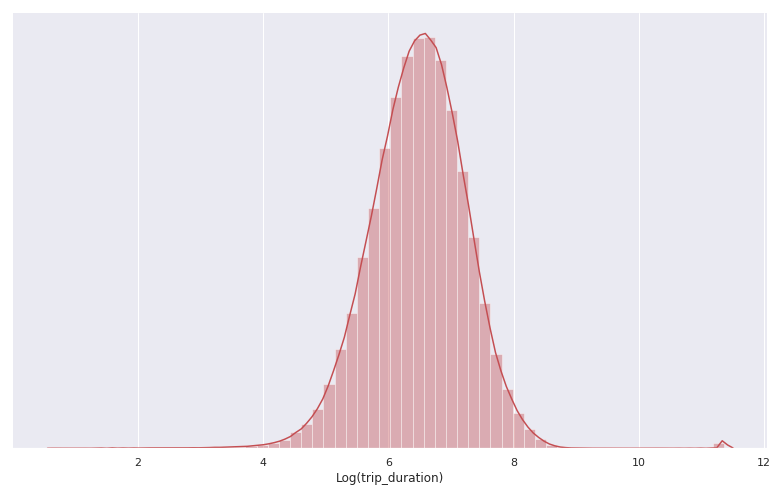

In [0]:
distplot_vis(train_set)
#This plot shows that the duration of trips follows gaussian distribution and it is concentrated at e^6.5 = 665.5 sec = 11 min
#there is some trips took e^11.5 = 27 hour which is very weird and other weird patterns happens at e^1 = 2 seconds
# which is impossible

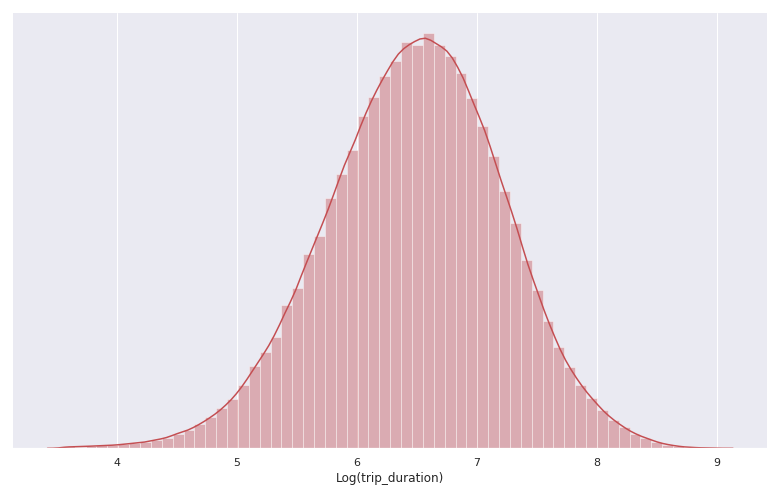

In [0]:
#removing outlier
train_set = train_set.loc[(train_set.trip_duration < math.exp(9)) & (train_set.trip_duration > math.exp(3.5))]
#plotting again
distplot_vis(train_set)


In [0]:
def loc_outlier(train):
    #filter latitude and longitude co-ordinates which are way far from New York's city
    west, south, east, north = -74.26, 40.50, -73.70, 40.92
    train = train[(train.pickup_latitude > south) & (train.pickup_latitude < north)]
    train = train[(train.dropoff_latitude > south) & (train.dropoff_latitude < north)]
    train = train[(train.pickup_longitude > west) & (train.pickup_longitude < east)]
    train = train[(train.dropoff_longitude > west) & (train.dropoff_longitude < east)]

In [0]:
def plot_lang_lat(data):
    sns.set(style="darkgrid", palette="muted")
    f, axes = plt.subplots(2,2,figsize=(10, 10), sharex=False, sharey = False)
    sns.despine(left=True)
    sns.distplot(train_set['pickup_latitude'].values, label = 'pickup_latitude',color="m",bins = 60, ax=axes[0,0])
    sns.distplot(train_set['pickup_longitude'].values, label = 'pickup_longitude',color="m",bins =60, ax=axes[0,1])
    sns.distplot(train_set['dropoff_latitude'].values, label = 'dropoff_latitude',color="g",bins =60, ax=axes[1, 0])
    sns.distplot(train_set['dropoff_longitude'].values, label = 'dropoff_longitude',color="g",bins =60, ax=axes[1, 1])
    plt.setp(axes, yticks=[])

    plt.tight_layout()
    plt.show()

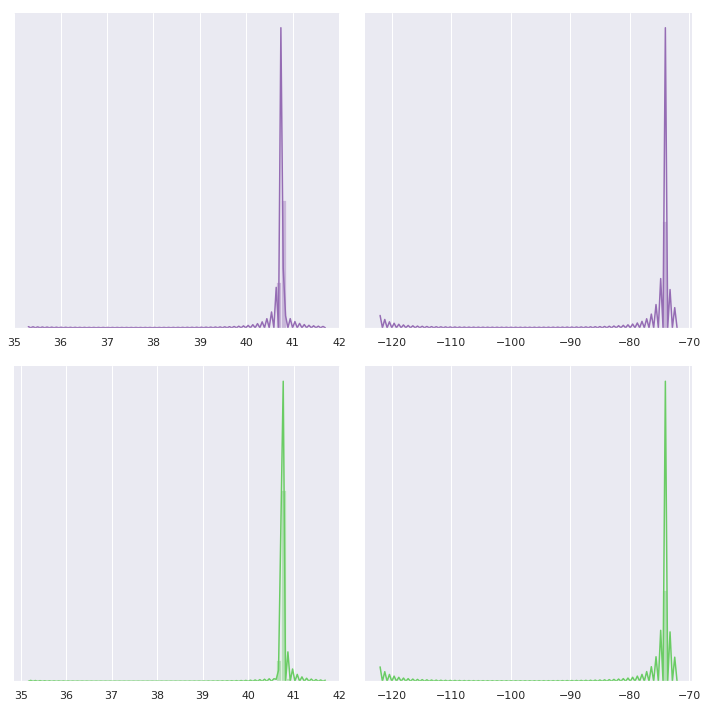

In [0]:
plot_lang_lat(train_set)
#the location of dropoff and pickup follows some specific range 
#from 40:42 for latitude and -80:-70 for longitude but there are many weird patterns too that make 
#the distributions have long tails

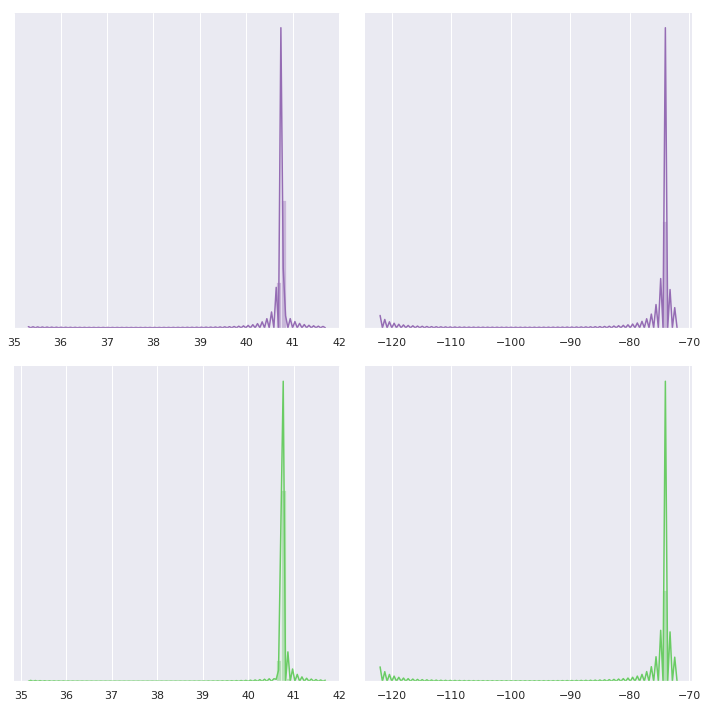

In [0]:
#removing outliers
loc_outlier(train_set)
plot_lang_lat(train_set)


In [0]:
from bokeh.palettes import Spectral4
from bokeh.plotting import figure, output_notebook, show
#new_df['pickup_datetime'] = pd.to_datetime(new_df.pickup_datetime)
output_notebook()
ts_v1 = pd.DataFrame(train_set.loc[train_set.vendor_id==1].groupby('pick_date')['trip_duration'].mean())
#now the data is indexed based on pick_date, we want to reset its index
#inplace = true to modify data inplace and not creating new object
ts_v1.reset_index(inplace = True)
ts_v2 = pd.DataFrame(train_set.loc[train_set.vendor_id==2].groupby('pick_date')['trip_duration'].mean())
ts_v2.reset_index(inplace = True)

p = figure(plot_width=800, plot_height=250, x_axis_type="datetime")
p.title.text = 'Click on legend entries to hide the corresponding lines'

for data, name, color in zip([ts_v1, ts_v2], ["vendor 1", "vendor 2"], Spectral4):
    p.line(data['pick_date'], data['trip_duration'], line_width=2, color=color, legend=name)

p.legend.location = "top_left"
p.legend.click_policy="hide"
show(p)

Loading BokehJS ...

In [0]:
from folium.plugins import HeatMap

def vis_map(x,y,data):
    base_map = folium.Map(location=[40.7128,-74.0060], control_scale=True, zoom_start=11)
    df = data.copy()
    df = df.head(100000)
    df['count'] = 1
    df[[x, y, 'count']].groupby([x, y]).sum().sort_values('count', ascending=False).head(10)

    #df = df.head(1000000)
    #print(len(df))
    #print(len(df_copy))
    m = HeatMap(data=df[[x, y, 'count']].groupby([x,y]).sum().reset_index().values.tolist(), radius=7, max_zoom=10).add_to(base_map)
    return base_map

In [0]:
vis_map("pickup_latitude","pickup_longitude",train_set)
#as we see the most congested points is in new york and manhattan and the airport!
#from wikipedia "Manhattan is the most densely populated of New York City’s 5 boroughs"


In [0]:
#the same for dropoff locations
vis_map("dropoff_latitude","dropoff_longitude",train_set)


In [0]:
#It is very similar to the pick up locations howevery it is more distributed than it

Text(0.5, 1.0, 'Number or dropoffs per hour')

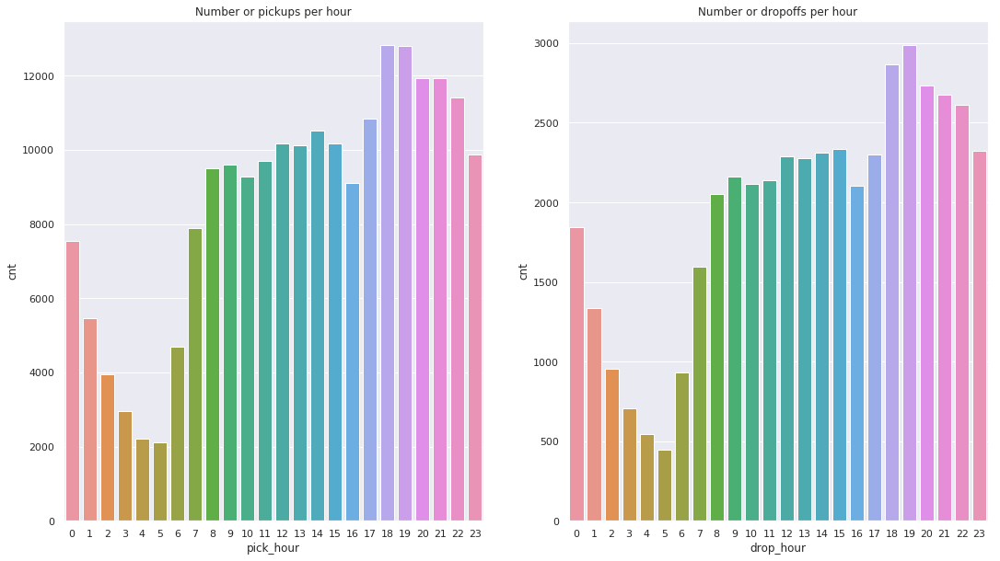

In [0]:
#df['pickup_datetime'] = pd.to_datetime(df.pickup_datetime)
#print(df['pickup_datetime'].dt.day)
df = train_set.copy()
df['cnt'] = 1
df = df[['pick_day','pick_hour','cnt']].copy()
df = pd.DataFrame(df.groupby(['pick_day','pick_hour'])['cnt'].sum())
df.reset_index(inplace = True)

df = pd.DataFrame(df.groupby('pick_hour')['cnt'].mean().round())
df.reset_index(inplace = True)
df = df.astype({"cnt": int})

#print(df.head(1000))
f, axes = plt.subplots(1,2,figsize=(18,10),sharex = False, sharey=False)

sns.barplot(df.pick_hour, df.cnt, ax =  axes[0]).set_title("Number or pickups per hour")

df = train_set.copy()
df['dropoff_datetime'] = pd.to_datetime(df.dropoff_datetime)
#print(df['pickup_datetime'].dt.day)
df.loc[:, 'drop_day'] = df['dropoff_datetime'].dt.day
df.loc[:, 'drop_hour'] = df['dropoff_datetime'].dt.hour
df['cnt'] = 1
df = df[['drop_day','drop_hour','cnt']].copy()
df = pd.DataFrame(df.groupby(['drop_day','drop_hour'])['cnt'].sum())
df.reset_index(inplace = True)

df = pd.DataFrame(df.groupby('drop_hour')['cnt'].mean().round())
df.reset_index(inplace = True)
df = df.astype({"cnt": int})

#print(df.head(1000))
sns.barplot(df.drop_hour,df.cnt,ax=axes[1]).set_title("Number or dropoffs per hour")


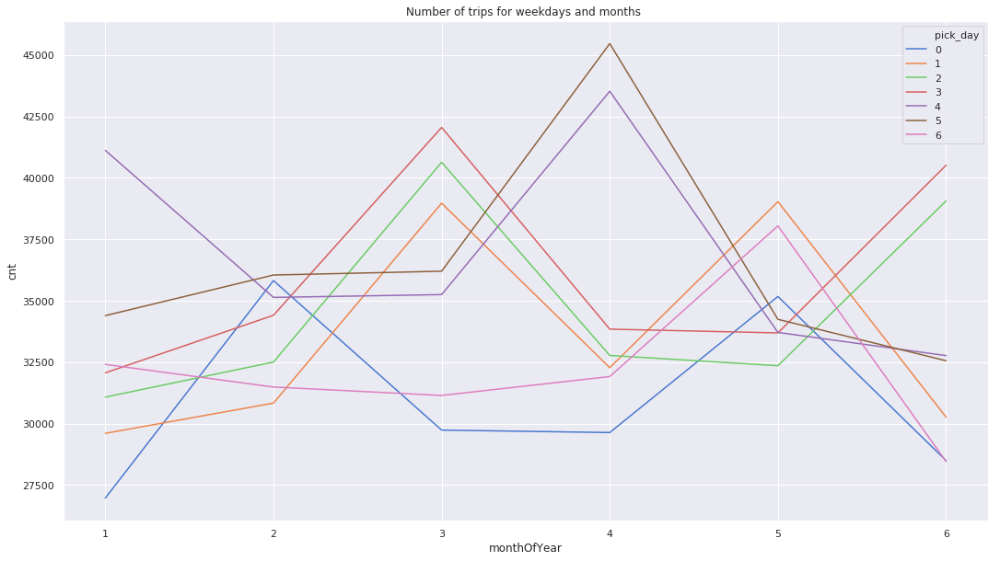

In [0]:
df = train_set.copy()
df['cnt'] = 1
df = df[['monthOfYear','pick_day','cnt']].copy()
df = pd.DataFrame(df.groupby(['monthOfYear','pick_day'])['cnt'].sum())
df = pd.DataFrame(df.groupby(['pick_day','monthOfYear'])['cnt'].mean())
df.reset_index(inplace = True)
fig, axes = plt.subplots(figsize=(18,10))
axes.set_title("Number of trips for weekdays and months ")
sns.lineplot(x="monthOfYear",y="cnt",data= df ,hue="pick_day", ax=axes, legend = "full", palette = sns.color_palette("muted", n_colors=7))

In [0]:
def count_plot(data, field):
    plt.figure(figsize=(14, 5))
    plt.title(field)
    sns.countplot(x=data[field], data=df)

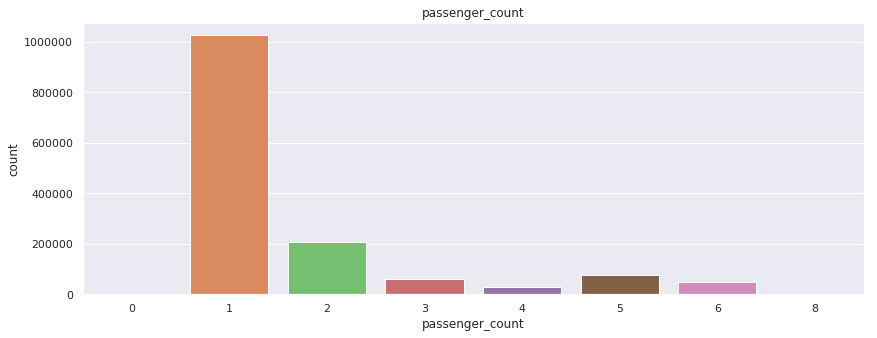

In [0]:
count_plot(train_set,'passenger_count')

In [0]:
#delete zero passengers records
train_set = train_set[train_set.passenger_count>0]

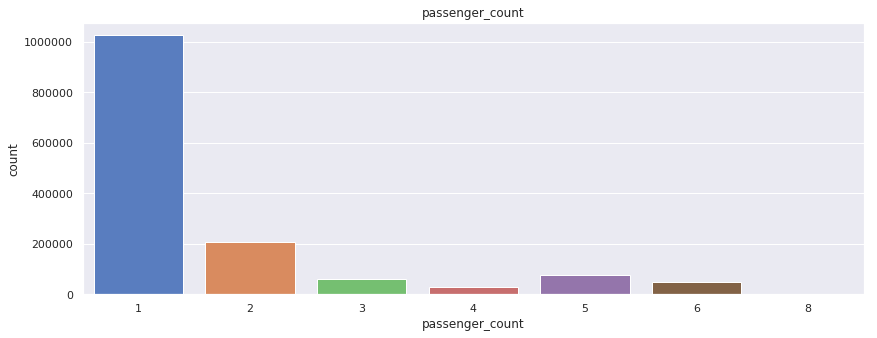

In [0]:
count_plot(train_set,'passenger_count')

In [0]:
print('Min trip distance (km): {0:.7f}'.format(train_set['euclidian_distance'].min()))
print('Min trip duration (s): {0:.2f}'.format(train_set['trip_duration'].min()))

Min trip distance (km): 0.0101003
Min trip duration (s): 34.00


In [0]:
#remove trips with zero distance

In [0]:
train_set = train_set[train_set.euclidian_distance> 0.01]

In [0]:
print('Min trip distance (km): {0:.7f}'.format(train_set['euclidian_distance'].min()))
print('Min trip duration (s): {0:.2f}'.format(train_set['trip_duration'].min()))

Min trip distance (km): 0.0101003
Min trip duration (s): 34.00


In [0]:
train_set.shape

(1445695, 28)

##  Feature Engineering

In [0]:
from sklearn.cluster import MiniBatchKMeans
coords = np.vstack((train_set[['pickup_latitude',  'pickup_longitude']].values,
                    train_set[['dropoff_latitude', 'dropoff_longitude']].values,
                    train_set[['pickup_latitude',  'pickup_longitude']].values,
                    train_set[['dropoff_latitude', 'dropoff_longitude']].values))
kmeans = MiniBatchKMeans(n_clusters=100, batch_size=10000).fit(coords)

In [0]:
def haversine_dis(lat1, lon1, lat2, lon2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km
  
def bearing_dis(lat1, lng1, lat2, lng2):
    """
    The bearing is the compass direction to travel from the starting point,
    """
    lng_delta_rad = np.radians(lng2 - lng1)
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    y = np.sin(lng_delta_rad) * np.cos(lat2)
    x = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(lng_delta_rad)
    return np.degrees(np.arctan2(y, x))
  


In [0]:
def derive_features(df):
    # Pickup-based features
    # Brand new features
    df['haversine_distance'] = df.apply(lambda x: haversine_dis(x['pickup_latitude'],  x['pickup_longitude'], 
                                                            x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
    df['bearing_distance'] = df.apply(lambda x: bearing_dis(x['pickup_latitude'],  x['pickup_longitude'], 
                                                            x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

    df['pickup_cluster']  = kmeans.predict(df[['pickup_latitude', 'pickup_longitude']])
    df['dropoff_cluster'] = kmeans.predict(df[['dropoff_latitude', 'dropoff_longitude']])
    return df

In [0]:
train_set = derive_features(train_set)

## Feature Selection



In [0]:
def plotCorrMat(data):
    data_num = data.select_dtypes(include=['float64', 'int64'])  # get numeric fields
    corr = data_num.drop('duration_min', axis=1).corr()  # We already examined SalePrice correlations
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.heatmap(corr,cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.01,
                 annot_kws={"size": 8}, square=True,mask=mask)
    plt.xticks(rotation=90)
    plt.title('Correlation between features')

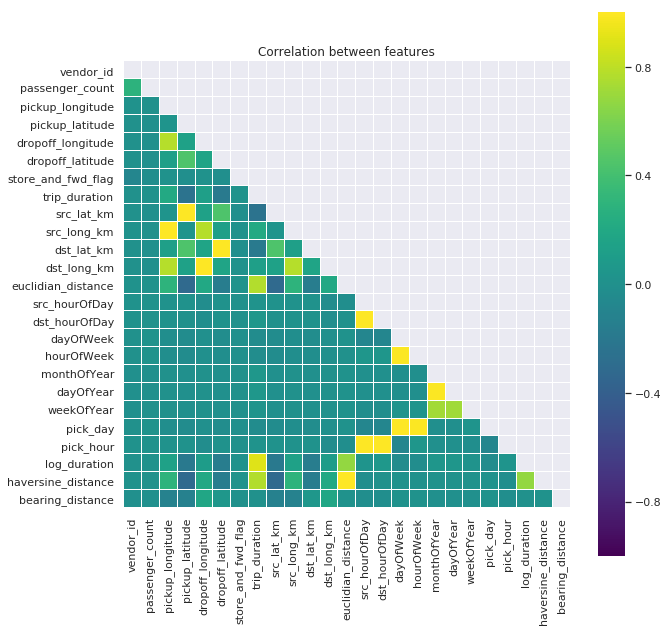

In [0]:
plotCorrMat(train_set)

In [0]:
def getmostcorrelated(data):
    data_num = data.select_dtypes(include=['float64', 'int64'])

    df_num_corr=data_num.drop('duration_min', axis=1).apply(
        lambda x: x.corr(data_num['duration_min']))
    golden_features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
    print("There is {} strongly correlated values with Trip Duration:\n{}".format(len(golden_features_list),
                                                                 golden_features_list))


In [0]:
getmostcorrelated(train_set)

There is 4 strongly correlated values with Trip Duration:
trip_duration         1.000000
log_duration          0.903766
euclidian_distance    0.770175
haversine_distance    0.770158
dtype: float64


In [0]:
#remove high correlated features and the time related features
features = ['passenger_count', 'src_lat_km', 'src_long_km', 'dst_lat_km', 'dst_long_km',
          'euclidian_distance', 'src_hourOfDay', 'dayOfWeek', 'hourOfWeek', 'pick_day', 'pick_hour',
          'monthOfYear', 'haversine_distance', 'bearing_distance', 'pickup_cluster', 'dropoff_cluster']
X = train_set[features]
y = np.log1p(train_set['trip_duration'])
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1445695 entries, 0 to 1458643
Data columns (total 16 columns):
passenger_count       1445695 non-null int64
src_lat_km            1445695 non-null float64
src_long_km           1445695 non-null float64
dst_lat_km            1445695 non-null float64
dst_long_km           1445695 non-null float64
euclidian_distance    1445695 non-null float64
src_hourOfDay         1445695 non-null float64
dayOfWeek             1445695 non-null int64
hourOfWeek            1445695 non-null float64
pick_day              1445695 non-null int64
pick_hour             1445695 non-null int64
monthOfYear           1445695 non-null int64
haversine_distance    1445695 non-null float64
bearing_distance      1445695 non-null float64
pickup_cluster        1445695 non-null int32
dropoff_cluster       1445695 non-null int32
dtypes: float64(9), int32(2), int64(5)
memory usage: 176.5 MB


## Model Training

In [0]:
def rmsle_eval(y, y0):
    y0 = y0.get_label()    
    assert len(y) == len(y0)
    return 'error', np.sqrt(np.mean(np.power(np.log1p(y)-np.log1p(y0), 2)))

In [0]:
from sklearn.model_selection import train_test_split
import xgboost as xgb
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=0)
dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_valid, label=y_valid)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]


parms = {'max_depth':8, #maximum depth of a tree
         'objective':'reg:linear',
         'eta'      :0.3, # learning rate
         'subsample':0.8,#Subsample ratio of the training instances. Setting it to 0.5 means that XGBoost would randomly sample half of the training data prior to growing trees. and this will prevent overfitting. Subsampling will occur once in every boosting iteration.
         'lambda '  :4, # L2 regularization term on weights
         'colsample_bytree ':0.9, # colsample_bytree is the subsample ratio of columns when constructing each tree. Subsampling occurs once for every tree constructed.
         'colsample_bylevel':1, # is the subsample ratio of columns for each level
         'min_child_weight': 10, #Minimum sum of instance weight (hessian) needed in a child. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight
         'nthread'  :3}  #number of cpu core to use

plst = list(parms.items())
#n_estimators specifies how many times to go through the modeling cycle.
#Typical values range from 100-1000
#model = xgb.train(plst, dtrain, 200, watchlist, early_stopping_rounds=50, maximize=False, 
#                  verbose_eval=20, feval=rmsle_eval)

model = xgb.train(plst, dtrain, num_boost_round=1000, evals = watchlist,
                  early_stopping_rounds=30, maximize=False, 
                  verbose_eval=100, feval=rmsle_eval)


/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[0]	train-rmse:4.22477	valid-rmse:4.22396	train-error:0.819025	valid-error:0.818912
Multiple eval metrics have been passed: 'valid-error' will be used for early stopping.

Will train until valid-error hasn't improved in 30 rounds.
[100]	train-rmse:0.301671	valid-rmse:0.319386	train-error:0.042192	valid-error:0.044999
[200]	train-rmse:0.289468	valid-rmse:0.316149	train-error:0.040337	valid-error:0.044595
[300]	train-rmse:0.280627	valid-rmse:0.314503	train-error:0.03899	valid-error:0.044383
Stopping. Best iteration:
[314]	train-rmse:0.279626	valid-rmse:0.314374	train-error:0.038842	valid-error:0.044368



In [0]:
def plot_importances(clf):
    importances = clf.get_fscore()
    importances = sorted(importances.items(), key=lambda x: x[1])
    x = list(zip(*importances))[0]
    y = list(zip(*importances))[1]
    x_pos = np.arange(len(x)) 
    plt.figure(figsize=(10,5))
    plt.title('Feature importances')
    plt.barh(range(len(y)), y, align='center')
    plt.yticks(range(len(y)), x)
    plt.ylim([-1, len(importances)])
    plt.xlabel('F score')
    plt.show()

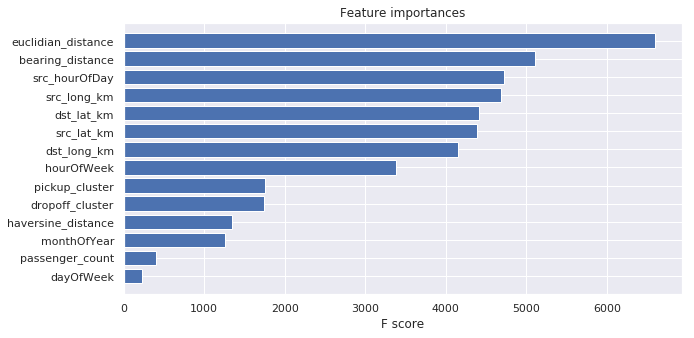

In [0]:
plot_importances(model)

## Testing

In [0]:
test_set = pd.read_csv("drive/My Drive/test.csv") #Reading the dataset in a dataframe using Pandas

In [0]:
changeinFields(test_set)

In [0]:
createUsefulFields(test_set)

In [0]:
test_set = derive_features(test_set)

In [0]:
test = test_set[features]
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625134 entries, 0 to 625133
Data columns (total 16 columns):
passenger_count       625134 non-null int64
src_lat_km            625134 non-null float64
src_long_km           625134 non-null float64
dst_lat_km            625134 non-null float64
dst_long_km           625134 non-null float64
euclidian_distance    625134 non-null float64
src_hourOfDay         625134 non-null float64
dayOfWeek             625134 non-null int64
hourOfWeek            625134 non-null float64
pick_day              625134 non-null int64
pick_hour             625134 non-null int64
monthOfYear           625134 non-null int64
haversine_distance    625134 non-null float64
bearing_distance      625134 non-null float64
pickup_cluster        625134 non-null int32
dropoff_cluster       625134 non-null int32
dtypes: float64(9), int32(2), int64(5)
memory usage: 71.5 MB


In [0]:
dtest = xgb.DMatrix(test)
ytest = model.predict(dtest)

In [0]:
ytest = np.exp(ytest)-1
submission = pd.DataFrame({'id': test_set.id, 'trip_duration': ytest})


In [0]:
submission.to_csv('submission.csv', index=False)

In [0]:
!cp submission.csv 'drive/My Drive/'

In [0]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1445695 entries, 0 to 1458643
Data columns (total 16 columns):
passenger_count       1445695 non-null int64
src_lat_km            1445695 non-null float64
src_long_km           1445695 non-null float64
dst_lat_km            1445695 non-null float64
dst_long_km           1445695 non-null float64
euclidian_distance    1445695 non-null float64
src_hourOfDay         1445695 non-null float64
dayOfWeek             1445695 non-null int64
hourOfWeek            1445695 non-null float64
pick_day              1445695 non-null int64
pick_hour             1445695 non-null int64
monthOfYear           1445695 non-null int64
haversine_distance    1445695 non-null float64
bearing_distance      1445695 non-null float64
pickup_cluster        1445695 non-null int32
dropoff_cluster       1445695 non-null int32
dtypes: float64(9), int32(2), int64(5)
memory usage: 176.5 MB


In [0]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625134 entries, 0 to 625133
Data columns (total 16 columns):
passenger_count       625134 non-null int64
src_lat_km            625134 non-null float64
src_long_km           625134 non-null float64
dst_lat_km            625134 non-null float64
dst_long_km           625134 non-null float64
euclidian_distance    625134 non-null float64
src_hourOfDay         625134 non-null float64
dayOfWeek             625134 non-null int64
hourOfWeek            625134 non-null float64
pick_day              625134 non-null int64
pick_hour             625134 non-null int64
monthOfYear           625134 non-null int64
haversine_distance    625134 non-null float64
bearing_distance      625134 non-null float64
pickup_cluster        625134 non-null int32
dropoff_cluster       625134 non-null int32
dtypes: float64(9), int32(2), int64(5)
memory usage: 71.5 MB
